In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
#change segmented masks into contours, then put contours in correct form for yolo segmentation
#ONLY RUN ONCE!!!
import cv2
import os

def extract_contours_for_yolo(segmented_images, labels_folder, class_id=0):
    # Ensure the labels folder exists
    os.makedirs(labels_folder, exist_ok=True)

    # Loop through all files in the input folder
    for filename in os.listdir(segmented_images):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')):  # Check for image files
            image_path = os.path.join(segmented_images, filename)
            output_file = os.path.join(labels_folder, os.path.splitext(filename)[0] + ".txt")

            # Load the image
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            height, width = image.shape

            # Threshold the image to ensure it's binary
            _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

            # Find contours
            contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # Extract polygon vertices and format for YOLOv8
            with open(output_file, "w") as f:
                for contour in contours:
                    # Squeeze the contour to remove extra dimensions and ensure it has the right shape
                    if len(contour.squeeze().shape) == 2:
                        vertices = contour.squeeze()
                        # Normalize the coordinates
                        normalized_vertices = [
                            (point[0] / width, point[1] / height) for point in vertices
                        ]
                        # Flatten vertices into YOLOv8 format
                        yolo_format = f"{class_id} " + " ".join([f"{x:.6f} {y:.6f}" for x, y in normalized_vertices])
                        f.write(f"{yolo_format}\n")

            print(f"Processed {filename} -> {output_file}")

# Example usage
input_folder1 = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/empty"
input_folder2 = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/valid"
labels_folder = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels"

# Process input folders
extract_contours_for_yolo(input_folder1, labels_folder, class_id=0)
extract_contours_for_yolo(input_folder2, labels_folder, class_id=1)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/empty'

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [ ]:
#define train/val/test splits from provided deepfish csv files
import pandas as pd

df_train = pd.read_csv('/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/train.csv')
df_val = pd.read_csv('/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/val.csv')
df_test = pd.read_csv('/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/test.csv')

df_train.head()

,ID,habitats,labels,classes,frames
0,valid/7623_F2_f000460,7623,1,valid,7623_F2_f000460
1,empty/7585_NF2_f000230,7585,0,empty,7585_NF2_f000230
2,empty/7434_NF3_f000160,7434,0,empty,7434_NF3_f000160
3,empty/7585_NF2_f000160,7585,0,empty,7585_NF2_f000160
4,valid/9866_acanthopagrus_palmaris_f000030,9866,1,valid,9866_acanthopagrus_palmaris_f000030


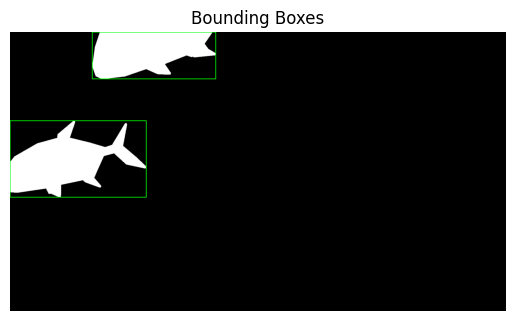

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_multiple_bounding_boxes(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError("Image not found or unable to load.")

    _, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    num_labels, labels = cv2.connectedComponents(binary)

    # initialize list
    bounding_boxes = []
    for label in range(1, num_labels):
        mask = (labels == label).astype(np.uint8)
        ys, xs = np.where(mask == 1)
        top, bottom = ys.min(), ys.max()
        left, right = xs.min(), xs.max()
        bounding_boxes.append((top, bottom, left, right))

    return bounding_boxes

def draw_multiple_bounding_boxes(image_path, bounding_boxes):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image not found or unable to load.")
    for (top, bottom, left, right) in bounding_boxes:
        cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)

    #plot result
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Bounding Boxes")
    plt.axis("off")
    plt.show()

image_path = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/valid/9892_Caranx_f000030.png"
bounding_boxes = find_multiple_bounding_boxes(image_path)
draw_multiple_bounding_boxes(image_path, bounding_boxes)


Source: GPT-4 for preprocessing yolo style folder and doing mass movements of folders in the next two images

In [ ]:
import cv2
import os

def process_images_to_yolo(input_folder_path, output_directory, class_index=0):
    """
    Processes all images in a folder and generates YOLO-format bounding box files.

    Args:
        input_folder_path (str): Path to the folder containing mask images.
        output_directory (str): Path to the directory where YOLO .txt files will be saved.
        class_index (int): Class index to assign to all detected objects. Default is 0.
    """
    # Ensure the output directory exists
    os.makedirs(output_directory, exist_ok=True)

    # Get all image files in the folder
    image_extensions = {".png", ".jpg", ".jpeg", ".bmp", ".tiff"}
    image_files = [
        os.path.join(input_folder_path, file)
        for file in os.listdir(input_folder_path)
        if os.path.splitext(file)[1].lower() in image_extensions
    ]

    for image_path in image_files:
        if not os.path.isfile(image_path):
            print(f"Warning: File not found or inaccessible: {image_path}")
            continue

        # Load the image in grayscale
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f"Error: Could not load image: {image_path}")
            continue

        # Ensure the white pixels are properly thresholded
        _, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

        # Check if there are any white pixels
        if np.count_nonzero(binary) == 0:
            # Create an empty file for this image
            image_name = os.path.basename(image_path)
            txt_file_name = os.path.splitext(image_name)[0] + '.txt'
            txt_file_path = os.path.join(output_directory, txt_file_name)
            open(txt_file_path, 'w').close()  # Create an empty file
            print(f"No white pixels found in {image_path}. Created empty file: {txt_file_path}")
            continue

        # Label connected components
        num_labels, labels = cv2.connectedComponents(binary)

        # Image dimensions
        height, width = binary.shape

        # Prepare output file name
        image_name = os.path.basename(image_path)
        txt_file_name = os.path.splitext(image_name)[0] + '.txt'
        txt_file_path = os.path.join(output_directory, txt_file_name)

        # Write YOLO labels to the output file
        with open(txt_file_path, 'w') as f:
            for label in range(1, num_labels):
                # Find coordinates of the current component
                mask = (labels == label).astype(np.uint8)
                ys, xs = np.where(mask == 1)
                top, bottom = ys.min(), ys.max()
                left, right = xs.min(), xs.max()

                # Calculate normalized YOLO coordinates
                x_center = ((left + right) / 2) / width
                y_center = ((top + bottom) / 2) / height
                bbox_width = (right - left) / width
                bbox_height = (bottom - top) / height

                # Write to file in YOLO format
                f.write(f"{class_index} {x_center:.6f} {y_center:.6f} {bbox_width:.6f} {bbox_height:.6f}\n")

        print(f"Processed {image_path} -> {txt_file_path}")
# Example usage
input_file_path1 = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/empty"
input_file_path2 = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/valid"
output_directory = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels"  # Directory to store YOLO label files

process_images_to_yolo(input_file_path1, output_directory)
process_images_to_yolo(input_file_path2, output_directory)


No white pixels found in /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/empty/7393_NF2_f000120.png. Created empty file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7393_NF2_f000120.txt
No white pixels found in /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/empty/7482_NF1_f000100.png. Created empty file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7482_NF1_f000100.txt
No white pixels found in /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/masks/empty/7393_NF2_f000000.png. Created empty file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7393_NF2_f000000.txt
No white pixels found in /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/

In [ ]:
#move images to specified slots according to yolo segmentation
import os
import shutil

def move_images_by_dataframe(df, image_folder, destination_folder):
    """
    Moves images listed in a DataFrame's "frames" column to a specified destination folder.

    Parameters:
        df (pd.DataFrame): DataFrame containing the column "frames" with image filenames (without extension).
        image_folder (str): Path to the folder containing the images.
        destination_folder (str): Path to the folder where matched images should be moved.
    """
    # Ensure the destination folder exists
    os.makedirs(destination_folder, exist_ok=True)

    # Iterate over the "frames" column
    for frame_name in df['frames']:
        # Append .jpg to the frame name
        frame_name_with_extension = f"{frame_name}.jpg"
        image_path = os.path.join(image_folder, frame_name_with_extension)
        dest_path = os.path.join(destination_folder, frame_name_with_extension)

        # Check if the image file exists and move it to the destination folder
        if os.path.isfile(image_path):
            shutil.move(image_path, dest_path)
            print(f"Moved: {image_path} -> {dest_path}")
        else:
            print(f"File not found: {image_path}")
txt_path = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels"
move_images_by_dataframe(df_train, '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train', txt_path)
move_images_by_dataframe(df_val, '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/val', txt_path)

File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train/7623_F2_f000460.jpg
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train/7585_NF2_f000230.jpg
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train/7434_NF3_f000160.jpg
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train/7585_NF2_f000160.jpg
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train/9866_acanthopagrus_palmaris_f000030.jpg
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train/9866_acanthopagrus_palmaris_f000270.jpg
File not found: /content/drive/MyDrive/cs2831 final

In [ ]:
#doing the same thing but for the txt files

#move txt to specified slots according to yolo segmentation
#ONLY RUN ONCE
import os
import shutil

def move_txt_by_dataframe(df, image_folder, destination_folder):
    # Ensure the destination folder exists
    os.makedirs(destination_folder, exist_ok=True)

    # Iterate over the "frames" column
    for frame_name in df['frames']:
        # Append .txt to the frame name
        frame_name_with_extension = f"{frame_name}.txt"
        image_path = os.path.join(image_folder, frame_name_with_extension)
        dest_path = os.path.join(destination_folder, frame_name_with_extension)

        # Check if the image file exists and move it to the destination folder
        if os.path.isfile(image_path):
            shutil.move(image_path, dest_path)
            print(f"Moved: {image_path} -> {dest_path}")
        else:
            print(f"File not found: {image_path}")

txt_path = "/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels"
move_txt_by_dataframe(df_train, txt_path, '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train')
move_txt_by_dataframe(df_val, txt_path, '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/val')
move_txt_by_dataframe(df_test, txt_path, '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/test')

File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7623_F2_f000460.txt
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7585_NF2_f000230.txt
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7434_NF3_f000160.txt
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/7585_NF2_f000160.txt
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/9866_acanthopagrus_palmaris_f000030.txt
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/9866_acanthopagrus_palmaris_f000270.txt
File not found: /content/drive/MyDrive/cs2831 final project/Training data (preprocessin

In [ ]:
import os

# Function to parse vertices from the text file
def read_contour_vertices(file_path):
    vertices = []
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for line in lines:
            line = line.strip()
            if line:  # Check if the line is not empty
                values = line.split()
                if len(values) % 2 == 0:  # Ensure the line contains pairs of coordinates
                    for i in range(0, len(values), 2):
                        x, y = map(float, values[i:i + 2])
                        vertices.append((x, y))
    return vertices

#use polyon to make bounding box for training set
def polygon_to_bounding_box(vertices):
    if not vertices:
        return []
    x_coords, y_coords = zip(*vertices)
    x_min, x_max = min(x_coords), max(x_coords)
    y_min, y_max = min(y_coords), max(y_coords)
    return [(x_min, y_min), (x_max, y_min), (x_max, y_max), (x_min, y_max)]

def write_bounding_box(file_path, vertices):
    with open(file_path, 'w') as file:
        for x, y in vertices:
            file.write(f"{x:.6f} {y:.6f} ")

def process_folder(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for file_name in os.listdir(input_folder):
        if file_name.endswith('.txt'):
            input_file_path = os.path.join(input_folder, file_name)
            vertices = read_contour_vertices(input_file_path)
            bounding_box = polygon_to_bounding_box(vertices)

            output_file_name = file_name
            output_file_path = os.path.join(output_folder, output_file_name)

            if not bounding_box:
                print(f"Empty input file: {input_file_path}")
                with open(output_file_path, 'w') as file:
                    pass
            else:
                write_bounding_box(output_file_path, bounding_box)
                print(f"Processed: {input_file_path} -> {output_file_path}")

input_folder = '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val'
output_folder = '/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/newval'
process_folder(input_folder, output_folder)



Empty input file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val/7426_NF2_f000120.txt
Empty input file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val/7398_NF2_f000130.txt
Empty input file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val/7463_NF1_f000010.txt
Empty input file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val/9870_no_fish_f000140.txt
Empty input file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val/9907_no_fish_2_f000300.txt
Empty input file: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/labels (for segmentation)/val/9892_no_fish_2_f000160.txt
Empty input file: /content/drive/MyDrive/cs2831 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#create yaml file for training
dataset_yaml = """
train: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/images/train
val: /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/images/val
names:
  0: fish
"""

with open('/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_data_detect.yaml', 'w') as f:
    f.write(dataset_yaml)

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 38.2 MB/s eta 0:00:00


In [ ]:
!pip uninstall -y torch torchvision torchaudio

# Clear Python's package cache
!pip cache purge


Found existing installation: torch 2.5.1+cu121
Uninstalling torch-2.5.1+cu121:
  Successfully uninstalled torch-2.5.1+cu121
Found existing installation: torchvision 0.20.1+cu121
Uninstalling torchvision-0.20.1+cu121:
  Successfully uninstalled torchvision-0.20.1+cu121
Found existing installation: torchaudio 2.5.1+cu121
Uninstalling torchaudio-2.5.1+cu121:
  Successfully uninstalled torchaudio-2.5.1+cu121
Files removed: 12


In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu
!pip install ultralytics


Looking in indexes: https://download.pytorch.org/whl/cpu
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 901.3/901.3 kB 13.0 MB/s eta 0:00:00


In [ ]:
import torch

from ultralytics import YOLO


PyTorch version: 2.5.1+cu121
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO imported successfully!


In [ ]:
!pip install tqdm


In [ ]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

bmodel = YOLO('yolov10n.pt')

# train model
results = bmodel.train(
    data='/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_data_detect.yaml',
    epochs=50,
    imgsz=640,
    task='detect',
    save=True,
    project='/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation',
    name='fish_detection_run_base'
)


100%|██████████| 5.59M/5.59M [00:00<00:00, 46.9MB/s]


Ultralytics 8.3.51 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_data_detect.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation, name=fish_detection_run_base, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nm

100%|██████████| 755k/755k [00:00<00:00, 11.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1      9856  ultralytics.nn.modules.block.SCDown          [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1     36096  ultralytics

train: Scanning /content/drive/.shortcut-targets-by-id/131mw57xOAJq3SOyEZGO_dkt_JLPRmc9x/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/train.cache... 310 images, 161 backgrounds, 0 corrupt: 100%|██████████| 310/310 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.23 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/.shortcut-targets-by-id/131mw57xOAJq3SOyEZGO_dkt_JLPRmc9x/cs2831 final project/Training data (preprocessing)/Segmentation/Data_for_model/labels/val.cache... 124 images, 59 backgrounds, 0 corrupt: 100%|██████████| 124/124 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      2.559         15      2.426          8        640: 100%|██████████| 20/20 [05:39<00:00, 16.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [02:14<00:00, 33.55s/it]

                   all        124         82    0.00183      0.829       0.16     0.0958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      2.757      12.45      2.497          3        640: 100%|██████████| 20/20 [05:21<00:00, 16.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.90s/it]

                   all        124         82    0.00191      0.866      0.155      0.084



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      2.933      11.38      2.704          4        640: 100%|██████████| 20/20 [05:24<00:00, 16.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.68s/it]

                   all        124         82      0.371     0.0221     0.0749     0.0376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      3.042      9.979      2.868          9        640: 100%|██████████| 20/20 [05:18<00:00, 15.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.98s/it]

                   all        124         82      0.443      0.184      0.186     0.0921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      3.191      9.234      2.834          6        640: 100%|██████████| 20/20 [05:20<00:00, 16.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.93s/it]

                   all        124         82      0.671     0.0854     0.0934     0.0255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      3.618      9.593      3.099          4        640: 100%|██████████| 20/20 [05:18<00:00, 15.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.99s/it]

                   all        124         82     0.0145     0.0488    0.00549    0.00248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      3.316      7.649      2.855          5        640: 100%|██████████| 20/20 [05:15<00:00, 15.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:29<00:00,  7.48s/it]

                   all        124         82      0.112      0.061     0.0336     0.0171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      3.293      6.588      2.817          8        640: 100%|██████████| 20/20 [05:17<00:00, 15.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.06s/it]

                   all        124         82      0.357      0.402      0.312      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      3.177      6.459      2.798          4        640: 100%|██████████| 20/20 [05:24<00:00, 16.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.87s/it]

                   all        124         82      0.573      0.293      0.387      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      3.014      5.171        2.7          6        640: 100%|██████████| 20/20 [05:18<00:00, 15.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.05s/it]

                   all        124         82      0.609      0.451      0.456       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      3.131      4.971      2.802          4        640: 100%|██████████| 20/20 [05:16<00:00, 15.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.72s/it]

                   all        124         82      0.586      0.341      0.428      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      2.942      4.643      2.769          8        640: 100%|██████████| 20/20 [05:19<00:00, 15.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.73s/it]

                   all        124         82      0.133       0.11     0.0712     0.0341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      3.031      4.689      2.858          9        640: 100%|██████████| 20/20 [05:18<00:00, 15.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.97s/it]

                   all        124         82       0.17      0.244       0.12       0.06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      2.805      4.272      2.657          1        640: 100%|██████████| 20/20 [05:21<00:00, 16.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.08s/it]

                   all        124         82      0.668      0.244      0.289      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      3.046      4.135        2.7          6        640: 100%|██████████| 20/20 [05:14<00:00, 15.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.91s/it]

                   all        124         82      0.408      0.329       0.32      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      2.855      3.564      2.656          8        640: 100%|██████████| 20/20 [05:21<00:00, 16.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.80s/it]

                   all        124         82      0.642      0.415      0.451      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      2.722      3.297      2.615          8        640: 100%|██████████| 20/20 [05:17<00:00, 15.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.99s/it]

                   all        124         82      0.766       0.61      0.691      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G      2.801      3.283      2.629          2        640: 100%|██████████| 20/20 [05:19<00:00, 15.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.97s/it]

                   all        124         82       0.66      0.593       0.68      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      2.684      2.867      2.509          6        640: 100%|██████████| 20/20 [05:19<00:00, 15.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.78s/it]

                   all        124         82      0.723      0.659      0.701      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      2.594       3.01      2.477          8        640: 100%|██████████| 20/20 [05:17<00:00, 15.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.58s/it]

                   all        124         82      0.605      0.549       0.58      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G      2.618      2.934      2.527          9        640: 100%|██████████| 20/20 [05:16<00:00, 15.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.00s/it]

                   all        124         82      0.777      0.585      0.703       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      2.487      2.611      2.407          9        640: 100%|██████████| 20/20 [05:18<00:00, 15.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.91s/it]

                   all        124         82       0.76      0.542      0.667      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      2.425      2.551      2.387          7        640: 100%|██████████| 20/20 [05:16<00:00, 15.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:29<00:00,  7.33s/it]

                   all        124         82       0.62      0.659      0.699      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      2.412       2.51      2.361          8        640: 100%|██████████| 20/20 [05:19<00:00, 15.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:29<00:00,  7.41s/it]

                   all        124         82      0.544      0.671      0.552      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      2.359      2.338      2.327          6        640: 100%|██████████| 20/20 [05:20<00:00, 16.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:30<00:00,  7.51s/it]

                   all        124         82      0.788       0.61      0.688      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      2.618      2.623      2.478         10        640: 100%|██████████| 20/20 [05:17<00:00, 15.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.94s/it]

                   all        124         82      0.806      0.683      0.757      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      2.454       2.26      2.323         10        640: 100%|██████████| 20/20 [05:21<00:00, 16.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.73s/it]

                   all        124         82      0.732      0.695      0.734      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      2.213      2.088      2.277          4        640: 100%|██████████| 20/20 [06:01<00:00, 18.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.06s/it]

                   all        124         82      0.826      0.695      0.761      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      2.061      2.055      2.186          7        640: 100%|██████████| 20/20 [05:25<00:00, 16.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.79s/it]

                   all        124         82      0.843      0.732      0.789      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      2.149      2.097      2.276          5        640: 100%|██████████| 20/20 [05:26<00:00, 16.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.09s/it]

                   all        124         82      0.874      0.759      0.833      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      2.155      1.861      2.279          7        640: 100%|██████████| 20/20 [05:20<00:00, 16.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.69s/it]

                   all        124         82      0.801      0.784      0.825       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      2.155      1.963      2.232          6        640: 100%|██████████| 20/20 [05:22<00:00, 16.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.08s/it]

                   all        124         82      0.819      0.683      0.789      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G      2.121      1.928      2.218          7        640: 100%|██████████| 20/20 [05:22<00:00, 16.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.68s/it]

                   all        124         82      0.852       0.72      0.802      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G      1.974      1.692       2.12          9        640: 100%|██████████| 20/20 [05:20<00:00, 16.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.97s/it]

                   all        124         82      0.843      0.707      0.812      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      1.944      1.628      2.123          9        640: 100%|██████████| 20/20 [05:21<00:00, 16.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.90s/it]

                   all        124         82      0.829      0.768      0.827       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G      2.007      1.865      2.173          8        640: 100%|██████████| 20/20 [05:16<00:00, 15.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.07s/it]

                   all        124         82      0.745      0.782      0.803      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G      2.004      1.642      2.137          7        640: 100%|██████████| 20/20 [05:19<00:00, 15.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.56s/it]

                   all        124         82      0.854       0.78      0.857      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G      1.908      1.586      2.127          5        640: 100%|██████████| 20/20 [05:19<00:00, 15.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.94s/it]

                   all        124         82      0.864      0.817      0.854      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G      1.843      1.601      2.079          8        640: 100%|██████████| 20/20 [05:17<00:00, 15.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.84s/it]

                   all        124         82      0.848      0.814      0.861      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      1.849      1.522      2.059          9        640: 100%|██████████| 20/20 [05:17<00:00, 15.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.82s/it]

                   all        124         82      0.926      0.768      0.871      0.665


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G       1.58      1.648      1.947          5        640: 100%|██████████| 20/20 [05:17<00:00, 15.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:26<00:00,  6.63s/it]

                   all        124         82      0.892       0.78      0.881      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      1.685      1.613      2.028          5        640: 100%|██████████| 20/20 [05:17<00:00, 15.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.94s/it]

                   all        124         82      0.956       0.72      0.873      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G       1.63      1.566       1.98          2        640: 100%|██████████| 20/20 [05:14<00:00, 15.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.90s/it]

                   all        124         82      0.898      0.752      0.865      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G       1.67      1.533       2.01          3        640: 100%|██████████| 20/20 [05:17<00:00, 15.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.08s/it]

                   all        124         82      0.862      0.765      0.834      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G      1.497      1.306      1.891          3        640: 100%|██████████| 20/20 [05:15<00:00, 15.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.98s/it]

                   all        124         82      0.883      0.735       0.83      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G      1.507      1.432      1.934          2        640: 100%|██████████| 20/20 [05:20<00:00, 16.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.95s/it]

                   all        124         82      0.861      0.756      0.838      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G       1.51      1.273      1.908          3        640: 100%|██████████| 20/20 [05:18<00:00, 15.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.11s/it]

                   all        124         82      0.847      0.768       0.84      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G       1.51      1.431      1.973          5        640: 100%|██████████| 20/20 [05:20<00:00, 16.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.16s/it]

                   all        124         82      0.863      0.805       0.84      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G      1.412      1.367       1.87          1        640: 100%|██████████| 20/20 [05:14<00:00, 15.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:27<00:00,  6.96s/it]

                   all        124         82      0.888      0.777      0.843      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G      1.456      1.332      1.904          3        640: 100%|██████████| 20/20 [05:17<00:00, 15.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:28<00:00,  7.10s/it]

                   all        124         82      0.826      0.809      0.844      0.694



50 epochs completed in 4.890 hours.
Optimizer stripped from /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base/weights/last.pt, 5.7MB
Optimizer stripped from /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base/weights/best.pt, 5.7MB

Validating /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base/weights/best.pt...
Ultralytics 8.3.51 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv10n summary (fused): 285 layers, 2,694,806 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:25<00:00,  6.40s/it]


                   all        124         82      0.852      0.773      0.844      0.693
Speed: 1.4ms preprocess, 176.1ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 901.3/901.3 kB 16.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/52 /content/drive/MyDrive/cs2831 final project/Test Data (florida keys)/test/images/Screenshot-2024-12-16-at-1-22-48-PM_png.rf.60fdc565edb292fe71006b87f9ea1038.jpg: 352x640 1 fish, 425.4ms
image 2/52 /content/drive/MyDrive/cs2831 final project/Test Data (florida keys)/test/images/Screenshot-2024-12-16-at-1-25-56-PM_png.rf.139af0812036df8c972cd14524fe5f6b.jpg: 352x640 2 fishs, 226.6ms
image 3/52 /content/drive/MyDrive/cs2831 final project/Test Data (florida keys)/test/images/Screenshot-2024-12-16-at-1-26-57-PM_png.rf.a812e294fece5a94708d91c2cca495f1.jpg: 352x640 (no detections), 222.6ms
image 

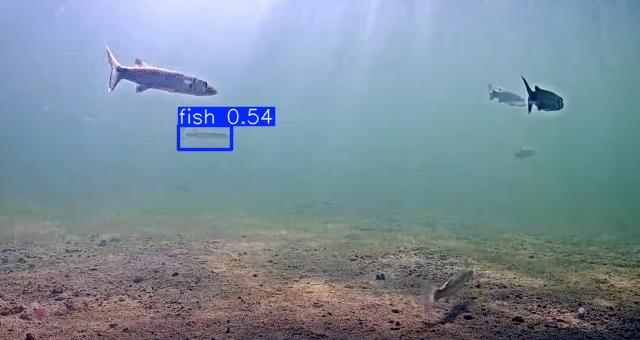

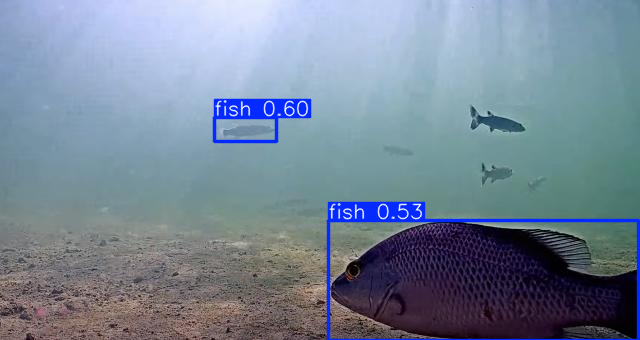

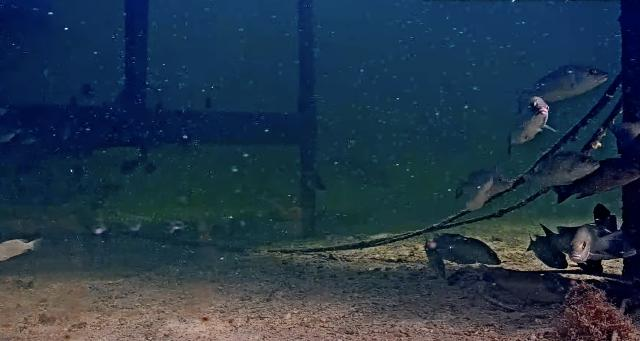

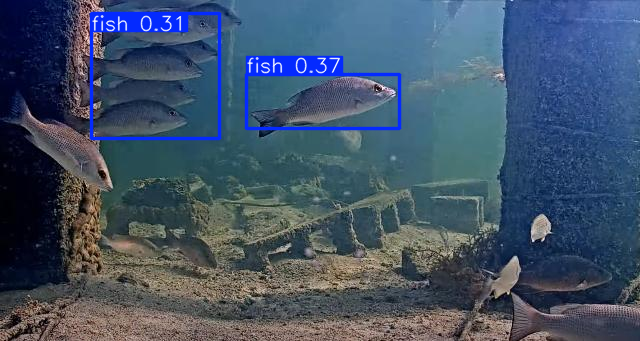

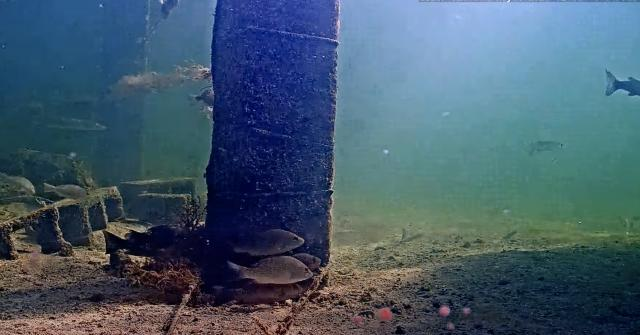

...

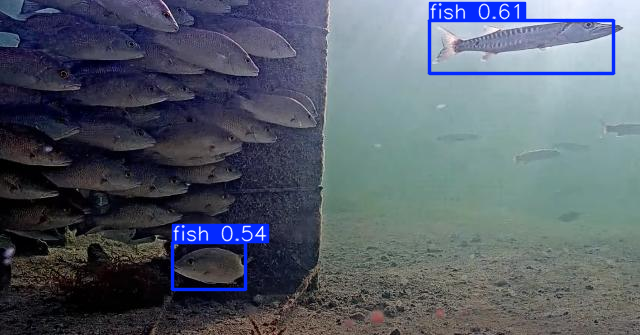

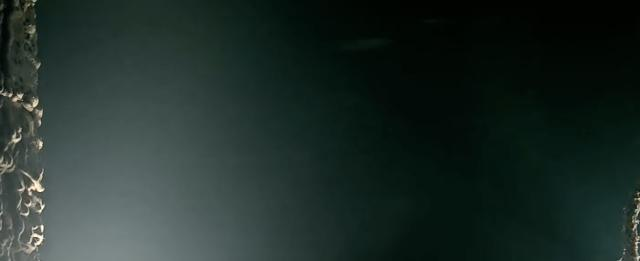

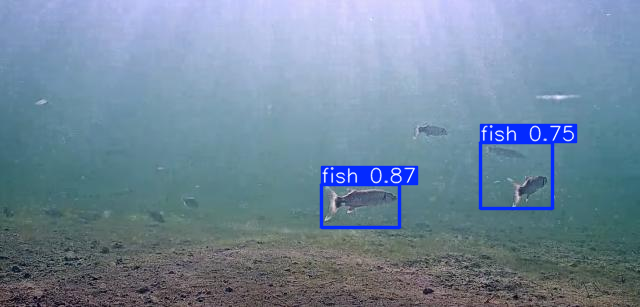

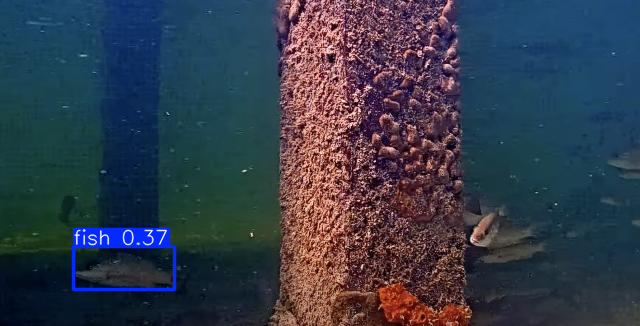

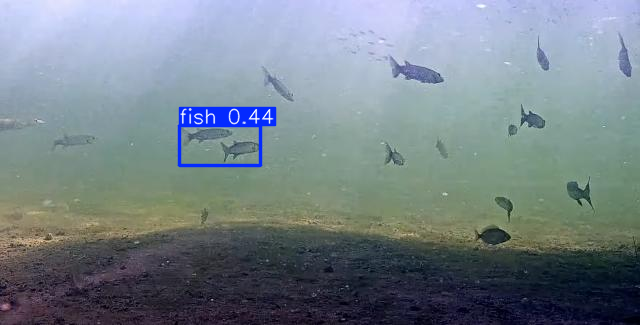

In [ ]:
#reinstall because google collab sucks
!pip install ultralytics
import os
import cv2
import torch
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
from ultralytics import YOLO
model = YOLO('/content/drive/MyDrive/cs2831 final project/Training data (preprocessing)/Segmentation/fish_detection_run_base/weights/best.pt')

# inference
results = model('/content/drive/MyDrive/cs2831 final project/Test Data (florida keys)/test/images')


#display test images with boxes
for result in results:
    boxes = result.boxes
    result.show()


In [ ]:
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    result.show()